In [107]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)


In [108]:
df=pd.read_excel(r'C:\Users\Siddhant\Desktop\doctor_train.xlsx')
df.head()

,Qualification,Experience,Rating,Place,Profile,Miscellaneous_Info,Fees
0,"BHMS, MD - Homeopathy",24 years experience,100%,"Kakkanad, Ernakulam",Homeopath,"100% 16 Feedback Kakkanad, Ernakulam",100
1,"BAMS, MD - Ayurveda Medicine",12 years experience,98%,"Whitefield, Bangalore",Ayurveda,"98% 76 Feedback Whitefield, Bangalore",350
2,"MBBS, MS - Otorhinolaryngology",9 years experience,NaN,"Mathikere - BEL, Bangalore",ENT Specialist,NaN,300
3,"BSc - Zoology, BAMS",12 years experience,NaN,"Bannerghatta Road, Bangalore",Ayurveda,"Bannerghatta Road, Bangalore ₹250 Available on...",250
4,BAMS,20 years experience,100%,"Keelkattalai, Chennai",Ayurveda,"100% 4 Feedback Keelkattalai, Chennai",250


In [109]:
dfn=pd.read_excel(r'C:\Users\Siddhant\Desktop\doctor_test.xlsx')
dfn.head()

,Qualification,Experience,Rating,Place,Profile,Miscellaneous_Info
0,MBBS,35 years experience,NaN,"Ghatkopar East, Mumbai",General Medicine,NaN
1,"MBBS, Diploma in Otorhinolaryngology (DLO)",31 years experience,NaN,"West Marredpally, Hyderabad",ENT Specialist,NaN
2,"MBBS, DDVL",40 years experience,70%,"KK Nagar, Chennai",Dermatologists,"70% 4 Feedback KK Nagar, Chennai"
3,BAMS,0 years experience,NaN,"New Ashok Nagar, Delhi",Ayurveda,NaN
4,"BDS, MDS - Conservative Dentistry & Endodontics",16 years experience,100%,"Kanakpura Road, Bangalore",Dentist,General Dentistry Conservative Dentistry Cosme...


# Basics of the dataset

In [110]:
df.shape

(5961, 7)

In [111]:
dfn.shape

(1987, 6)

In [112]:
df.dtypes

Qualification         object
Experience            object
Rating                object
Place                 object
Profile               object
Miscellaneous_Info    object
Fees                   int64
dtype: object

In [113]:
dfn.dtypes

Qualification         object
Experience            object
Rating                object
Place                 object
Profile               object
Miscellaneous_Info    object
dtype: object

In [114]:
df.columns

Index(['Qualification', 'Experience', 'Rating', 'Place', 'Profile',
       'Miscellaneous_Info', 'Fees'],
      dtype='object')

In [115]:
df.nunique()

Qualification         1420
Experience              64
Rating                  51
Place                  877
Profile                  6
Miscellaneous_Info    2998
Fees                    40
dtype: int64

In [116]:
dfn.nunique()

Qualification          630
Experience              57
Rating                  36
Place                  592
Profile                  6
Miscellaneous_Info    1084
dtype: int64

# -->Finding the missing values

In [117]:
count=df.isnull().sum()
count

Qualification            0
Experience               0
Rating                3302
Place                   25
Profile                  0
Miscellaneous_Info    2620
Fees                     0
dtype: int64

In [118]:
count=dfn.isnull().sum()
count

Qualification            0
Experience               0
Rating                1090
Place                    6
Profile                  0
Miscellaneous_Info     834
dtype: int64

In [119]:
df = df[df.Place.notnull()]

In [120]:
dfn = dfn[dfn.Place.notnull()]    

In [121]:
count=df.isnull().sum()
count

Qualification            0
Experience               0
Rating                3277
Place                    0
Profile                  0
Miscellaneous_Info    2595
Fees                     0
dtype: int64

In [122]:
count=dfn.isnull().sum()
count

Qualification            0
Experience               0
Rating                1084
Place                    0
Profile                  0
Miscellaneous_Info     828
dtype: int64

In [123]:
df.drop(columns=['Miscellaneous_Info'],inplace=True)

In [124]:
dfn.drop(columns=['Miscellaneous_Info'],inplace=True)

In [125]:
count=df.isnull().sum()
count

Qualification       0
Experience          0
Rating           3277
Place               0
Profile             0
Fees                0
dtype: int64

In [126]:
count=dfn.isnull().sum()
count

Qualification       0
Experience          0
Rating           1084
Place               0
Profile             0
dtype: int64

In [127]:
df = df[df.Rating.notnull()]

In [128]:
dfn = dfn[dfn.Rating.notnull()]

In [129]:
count=df.isnull().sum()
count

Qualification    0
Experience       0
Rating           0
Place            0
Profile          0
Fees             0
dtype: int64

In [130]:
count=dfn.isnull().sum()
count

Qualification    0
Experience       0
Rating           0
Place            0
Profile          0
dtype: int64

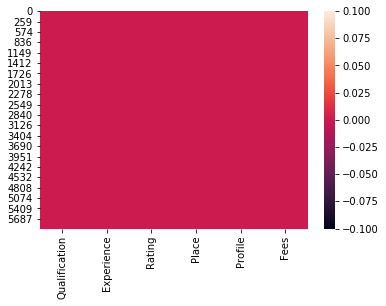

In [131]:
sns.heatmap(df.isnull())

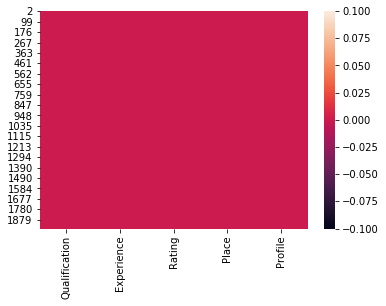

In [132]:
sns.heatmap(dfn.isnull())

In [133]:
df['exp']=df['Experience'].str.slice(stop=2).astype(int)

In [134]:
dfn['exp']=dfn['Experience'].str.slice(stop=2).astype(int)

In [135]:
df['rate']=df['Rating'].str.slice(stop=-1).astype(int)

In [136]:
dfn['rate']=dfn['Rating'].str.slice(stop=-1).astype(int)

In [137]:
df.drop(columns=['Experience','Rating'],inplace=True)

In [138]:
dfn.drop(columns=['Experience','Rating'],inplace=True)

In [139]:
new = df["Qualification"].str.split(',',expand=True)

In [140]:
df_new = pd.concat([df, new], axis=1)

In [141]:
df_new.drop(columns=['Qualification'],inplace=True)

In [142]:
test = dfn["Qualification"].str.split(',',expand=True)

In [143]:
df_test = pd.concat([dfn, test], axis=1)

In [144]:
df_test.drop(columns=['Qualification'],inplace=True)

In [145]:
df_test.head()

,Place,Profile,exp,rate,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16
2,"KK Nagar, Chennai",Dermatologists,40,70,MBBS,DDVL,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
4,"Kanakpura Road, Bangalore",Dentist,16,100,BDS,MDS - Conservative Dentistry & Endodontics,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
5,"Velachery, Chennai",Dentist,14,90,BDS,MDS,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
6,"Frazer Town, Bangalore",ENT Specialist,23,94,MBBS,Diploma in Otorhinolaryngology (DLO),None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
7,"Attapur, Hyderabad",Dentist,9,94,BDS,MDS - Pedodontics,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None


# Visualization

In [146]:
df_new.head()

,Place,Profile,Fees,exp,rate,0,1,2,3,4,5,6,7,8,9
0,"Kakkanad, Ernakulam",Homeopath,100,24,100,BHMS,MD - Homeopathy,None,None,None,None,None,None,None,None
1,"Whitefield, Bangalore",Ayurveda,350,12,98,BAMS,MD - Ayurveda Medicine,None,None,None,None,None,None,None,None
4,"Keelkattalai, Chennai",Ayurveda,250,20,100,BAMS,None,None,None,None,None,None,None,None,None
7,"Arekere, Bangalore",Dentist,200,10,99,BDS,None,None,None,None,None,None,None,None,None
12,"Coimbatore Racecourse, Coimbatore",Dentist,200,9,98,BDS,MDS,None,None,None,None,None,None,None,None


In [147]:
df_new.dtypes

Place      object
Profile    object
Fees        int64
exp         int32
rate        int32
0          object
1          object
2          object
3          object
4          object
5          object
6          object
7          object
8          object
9          object
dtype: object

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x00000133878AD988>,
      dtype=object)

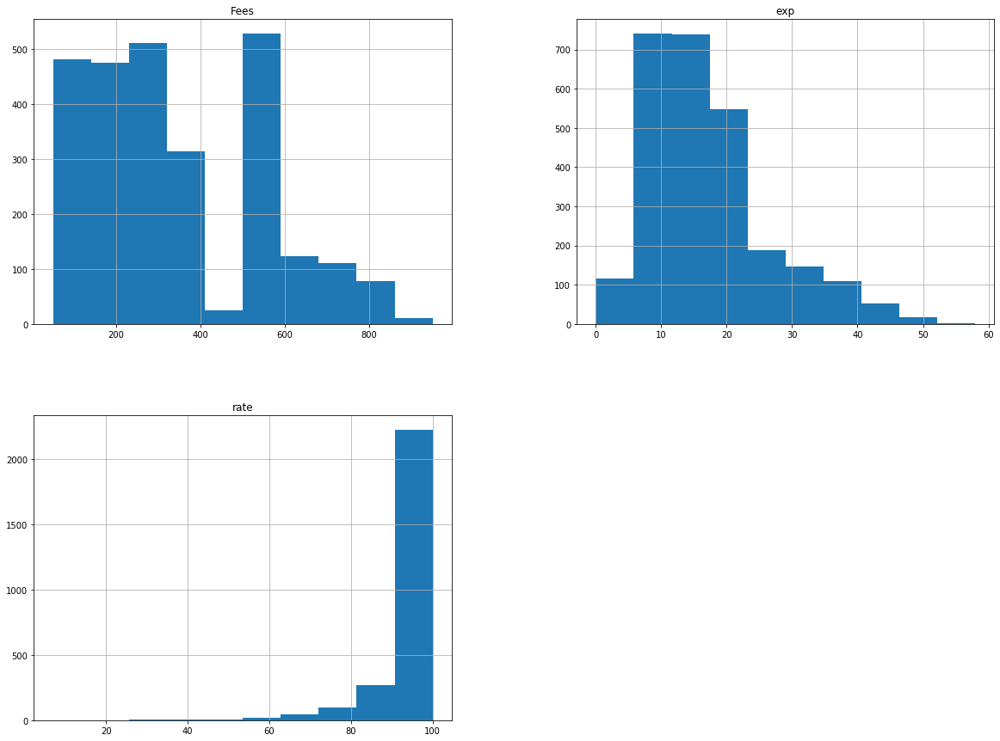

In [148]:
fig = plt.figure(figsize = (20,15))
ax = fig.gca()
df_new.hist(ax = ax)

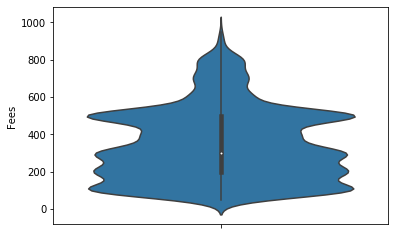

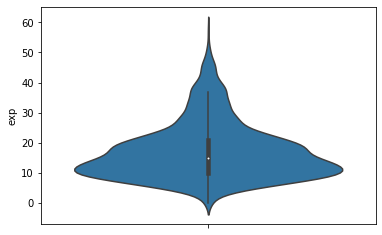

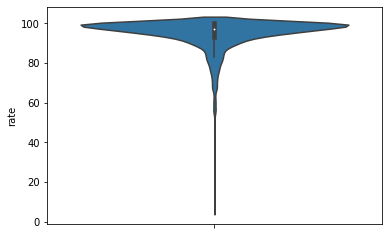

In [149]:
for i in ['Fees','exp','rate']:
    sns.violinplot(y=i,data=df_new)
    plt.show()

In [150]:
df_new.nunique()

Place      568
Profile      6
Fees        25
exp         55
rate        51
0           82
1          278
2          289
3          153
4           68
5           23
6            7
7            4
8            3
9            1
dtype: int64

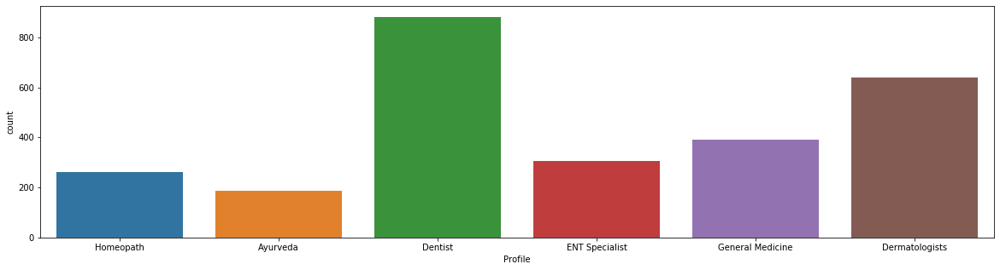

In [151]:
for i in ['Profile']:
    plt.figure(figsize=(20,5))
    sns.countplot(df_new[i])
    plt.show()

In [152]:
import statistics
for i in ['Place']:
    print(statistics.mode(df_new[i]))
    

HSR Layout, Bangalore


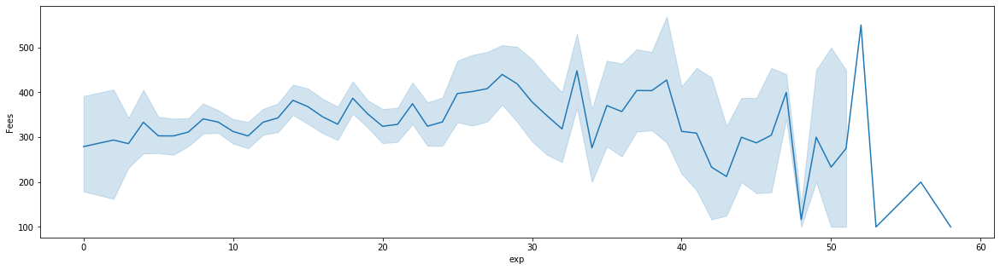

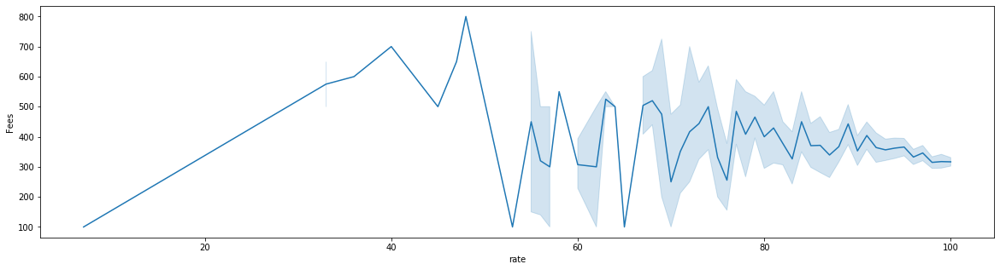

In [153]:
for i in ['exp','rate']:
    plt.figure(figsize=(20,5))
    sns.lineplot(x=df_new[i],y=df_new['Fees'],data=df_new)
    plt.show()

# Combining train and test data for label encoding

In [154]:
dft = pd.concat([df_new,df_test], ignore_index=True)

In [155]:
dft

,Place,Profile,Fees,exp,rate,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16
0,"Kakkanad, Ernakulam",Homeopath,100.0,24,100,BHMS,MD - Homeopathy,None,None,None,None,None,None,None,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,"Whitefield, Bangalore",Ayurveda,350.0,12,98,BAMS,MD - Ayurveda Medicine,None,None,None,None,None,None,None,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,"Keelkattalai, Chennai",Ayurveda,250.0,20,100,BAMS,None,None,None,None,None,None,None,None,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,"Arekere, Bangalore",Dentist,200.0,10,99,BDS,None,None,None,None,None,None,None,None,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,"Coimbatore Racecourse, Coimbatore",Dentist,200.0,9,98,BDS,MDS,None,None,None,None,None,None,None,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,"KPHB, Hyderabad",ENT Specialist,400.0,19,79,MBBS,MS - ENT,None,None,None,None,None,None,None,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,"HSR Layout, Bangalore",General Medicine,150.0,19,100,MBBS,None,None,None,None,None,None,None,None,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,"Pollachi, Coimbatore",Dentist,100.0,21,100,MDS,DNB,BDS,None,None,None,None,None,None,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,"HSR Layout, Bangalore",General Medicine,500.0,25,100,MBBS,IBCLC (USA),None,None,None,None,None,None,None,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,"Kukatpally, Hyderabad",General Medicine,250.0,12,95,MBBS,MD - General Medicine,Post Graduate Diploma in Diabetology (PGDD),None,None,None,None,None,None,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [156]:
count=dft.isnull().sum()
count

Place         0
Profile       0
Fees        897
exp           0
rate          0
0             0
1           717
2          2442
3          3210
4          3445
5          3526
6          3547
7          3550
8          3551
9          3554
10         3555
11         3555
12         3555
13         3555
14         3555
15         3555
16         3555
dtype: int64

# Using Labelencoder to transform object values into usable numeric data

In [157]:
from sklearn.preprocessing import LabelEncoder

In [158]:
for i in ['Place','Profile']:
    le=LabelEncoder()
    dft[i]=le.fit_transform(dft[i])
    

In [159]:
dft.head()

,Place,Profile,Fees,exp,rate,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16
0,237,5,100.0,24,100,BHMS,MD - Homeopathy,None,None,None,None,None,None,None,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,633,0,350.0,12,98,BAMS,MD - Ayurveda Medicine,None,None,None,None,None,None,None,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,264,0,250.0,20,100,BAMS,None,None,None,None,None,None,None,None,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,28,1,200.0,10,99,BDS,None,None,None,None,None,None,None,None,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,109,1,200.0,9,98,BDS,MDS,None,None,None,None,None,None,None,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [160]:
dft.dtypes

Place        int32
Profile      int32
Fees       float64
exp          int32
rate         int32
0           object
1           object
2           object
3           object
4           object
5           object
6           object
7           object
8           object
9           object
10          object
11          object
12          object
13          object
14          object
15          object
16          object
dtype: object

In [161]:
for i in [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16]:
    dft[i].fillna('missing', inplace = True) 
  

In [162]:
dft.head()

,Place,Profile,Fees,exp,rate,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16
0,237,5,100.0,24,100,BHMS,MD - Homeopathy,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing
1,633,0,350.0,12,98,BAMS,MD - Ayurveda Medicine,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing
2,264,0,250.0,20,100,BAMS,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing
3,28,1,200.0,10,99,BDS,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing
4,109,1,200.0,9,98,BDS,MDS,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing


In [163]:
for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16]:
    dft[i]=le.fit_transform(dft[i])
  

In [164]:
dft.head()

,Place,Profile,Fees,exp,rate,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16
0,237,5,100.0,24,100,3,197,345,186,85,29,9,6,5,2,1,1,1,1,1,1,1
1,633,0,350.0,12,98,1,189,345,186,85,29,9,6,5,2,1,1,1,1,1,1,1
2,264,0,250.0,20,100,1,336,345,186,85,29,9,6,5,2,1,1,1,1,1,1,1
3,28,1,200.0,10,99,2,336,345,186,85,29,9,6,5,2,1,1,1,1,1,1,1
4,109,1,200.0,9,98,2,215,345,186,85,29,9,6,5,2,1,1,1,1,1,1,1


In [165]:
count=dft.isnull().sum()
count

Place        0
Profile      0
Fees       897
exp          0
rate         0
0            0
1            0
2            0
3            0
4            0
5            0
6            0
7            0
8            0
9            0
10           0
11           0
12           0
13           0
14           0
15           0
16           0
dtype: int64

# Now separating the dataset into initial training and test data

In [166]:
tra=dft.iloc[0:2659,]

In [167]:
tra

,Place,Profile,Fees,exp,rate,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16
0,237,5,100.0,24,100,3,197,345,186,85,29,9,6,5,2,1,1,1,1,1,1,1
1,633,0,350.0,12,98,1,189,345,186,85,29,9,6,5,2,1,1,1,1,1,1,1
2,264,0,250.0,20,100,1,336,345,186,85,29,9,6,5,2,1,1,1,1,1,1,1
3,28,1,200.0,10,99,2,336,345,186,85,29,9,6,5,2,1,1,1,1,1,1,1
4,109,1,200.0,9,98,2,215,345,186,85,29,9,6,5,2,1,1,1,1,1,1,1
5,229,3,400.0,19,79,52,256,345,186,85,29,9,6,5,2,1,1,1,1,1,1,1
6,174,4,150.0,19,100,52,336,345,186,85,29,9,6,5,2,1,1,1,1,1,1,1
7,453,1,100.0,21,100,70,54,8,186,85,29,9,6,5,2,1,1,1,1,1,1,1
8,174,4,500.0,25,100,52,161,345,186,85,29,9,6,5,2,1,1,1,1,1,1,1
9,297,4,250.0,12,95,52,195,319,186,85,29,9,6,5,2,1,1,1,1,1,1,1


In [168]:
tes=dft.iloc[2659:3556,]
tes

,Place,Profile,Fees,exp,rate,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16
2659,228,2,NaN,40,70,52,41,345,186,85,29,9,6,5,2,1,1,1,1,1,1,1
2660,249,1,NaN,16,100,2,216,345,186,85,29,9,6,5,2,1,1,1,1,1,1,1
2661,606,1,NaN,14,90,2,215,345,186,85,29,9,6,5,2,1,1,1,1,1,1,1
2662,148,3,NaN,23,94,52,104,345,186,85,29,9,6,5,2,1,1,1,1,1,1,1
2663,34,1,NaN,9,94,2,228,345,186,85,29,9,6,5,2,1,1,1,1,1,1,1
2664,51,0,NaN,11,99,55,8,342,134,85,29,9,6,5,2,1,1,1,1,1,1,1
2665,146,1,NaN,4,100,2,336,345,186,85,29,9,6,5,2,1,1,1,1,1,1,1
2666,265,2,NaN,11,98,52,40,345,186,85,29,9,6,5,2,1,1,1,1,1,1,1
2667,55,2,NaN,13,99,52,192,345,186,85,29,9,6,5,2,1,1,1,1,1,1,1
2668,582,2,NaN,16,87,52,192,345,186,85,29,9,6,5,2,1,1,1,1,1,1,1


# Correlation matrix

In [169]:
tra.drop(columns=[10,11,12,13,14,15,16],inplace=True)

In [170]:
dco=tra.corr()
dco

,Place,Profile,Fees,exp,rate,0,1,2,3,4,5,6,7,8,9
Place,1.000000,-0.004233,-0.045192,-0.004347,0.022063,-0.020741,0.017326,0.028765,0.041543,0.030542,-0.001370,0.017552,0.011556,0.030956,0.028394
Profile,-0.004233,1.000000,0.156301,0.202379,-0.188409,0.320582,-0.014440,-0.037628,-0.008747,-0.038111,-0.012175,-0.051545,-0.024371,-0.019929,0.016308
Fees,-0.045192,0.156301,1.000000,0.059045,-0.133572,0.254068,-0.111246,-0.108741,-0.065955,-0.074793,0.021354,0.031987,0.026939,0.017678,0.004314
exp,-0.004347,0.202379,0.059045,1.000000,-0.313592,0.147850,-0.042128,-0.025023,0.032120,0.003215,0.002042,-0.025875,-0.022139,-0.001425,-0.010135
rate,0.022063,-0.188409,-0.133572,-0.313592,1.000000,-0.268605,0.064664,0.017149,-0.031738,0.004338,-0.011311,0.027614,0.037627,0.007173,-0.005822
0,-0.020741,0.320582,0.254068,0.147850,-0.268605,1.000000,-0.433767,-0.162468,-0.083829,-0.051688,-0.036986,-0.023693,-0.021375,-0.017333,-0.010335
1,0.017326,-0.014440,-0.111246,-0.042128,0.064664,-0.433767,1.000000,0.206790,0.097411,0.045841,0.020033,0.044058,0.044958,0.029126,0.032800
2,0.028765,-0.037628,-0.108741,-0.025023,0.017149,-0.162468,0.206790,1.000000,0.359898,0.161675,0.072816,0.060334,0.051667,0.034318,0.050666
3,0.041543,-0.008747,-0.065955,0.032120,-0.031738,-0.083829,0.097411,0.359898,1.000000,0.448980,0.218042,0.102913,0.075379,0.104894,0.092851
4,0.030542,-0.038111,-0.074793,0.003215,0.004338,-0.051688,0.045841,0.161675,0.448980,1.000000,0.431080,0.219964,0.199356,0.254054,0.161200


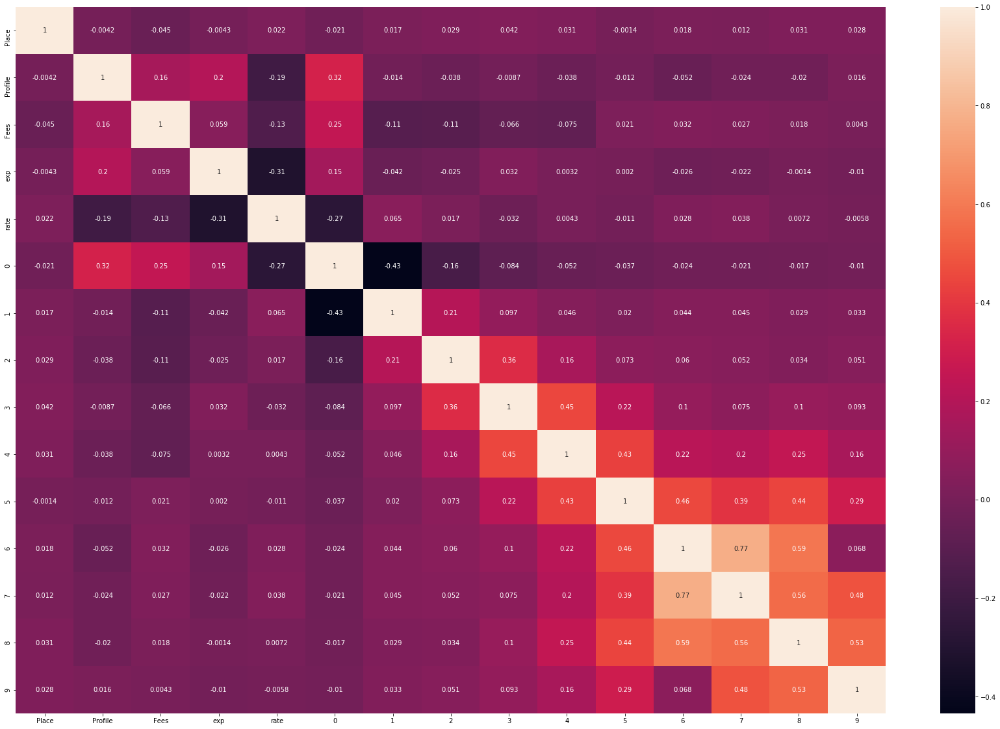

In [171]:
plt.figure(figsize=(30,20))
sns.heatmap(dco,annot=True)

# Statistics Summary

In [172]:
tra.describe()

,Place,Profile,Fees,exp,rate,0,1,2,3,4,5,6,7,8,9
count,2659.000000,2659.000000,2659.000000,2659.000000,2659.000000,2659.000000,2659.000000,2659.000000,2659.000000,2659.00000,2659.000000,2659.000000,2659.000000,2659.000000,2659.000000
mean,304.727717,2.229786,342.890184,17.067695,94.643475,31.343738,205.245581,296.194810,177.355773,83.77059,28.865363,8.987589,5.995863,4.997744,1.999624
std,187.708947,1.462936,192.858008,9.441073,7.852813,27.510459,100.693821,93.119807,31.206088,8.03571,1.663104,0.281476,0.121060,0.072540,0.019393
min,0.000000,0.000000,50.000000,0.000000,7.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,1.000000,2.000000,1.000000
25%,148.000000,1.000000,200.000000,10.000000,93.000000,2.000000,163.500000,312.500000,186.000000,85.00000,29.000000,9.000000,6.000000,5.000000,2.000000
50%,296.000000,2.000000,300.000000,15.000000,97.000000,52.000000,210.000000,345.000000,186.000000,85.00000,29.000000,9.000000,6.000000,5.000000,2.000000
75%,463.000000,3.000000,500.000000,21.000000,100.000000,52.000000,285.500000,345.000000,186.000000,85.00000,29.000000,9.000000,6.000000,5.000000,2.000000
max,641.000000,5.000000,950.000000,58.000000,100.000000,98.000000,336.000000,345.000000,186.000000,85.00000,29.000000,9.000000,6.000000,5.000000,2.000000


# Checking for skewness and outliers distribution:-

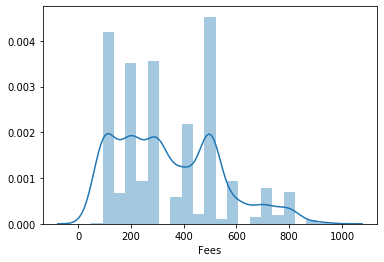

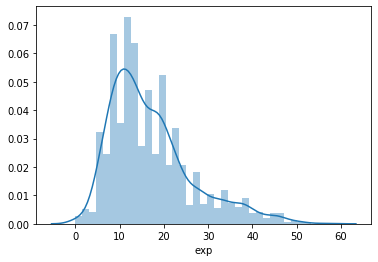

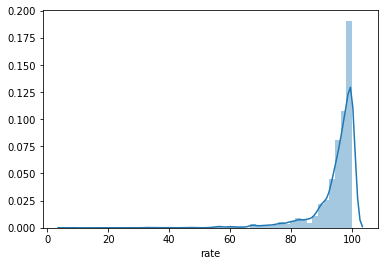

In [173]:
for i in ['Fees','exp','rate']:
    sns.distplot(tra[i])
    plt.show()
    

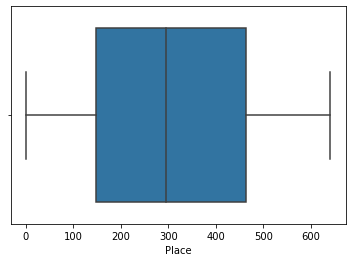

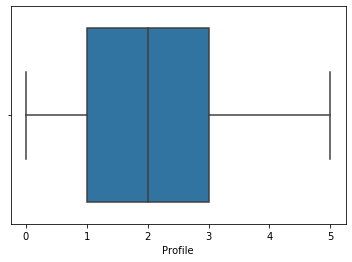

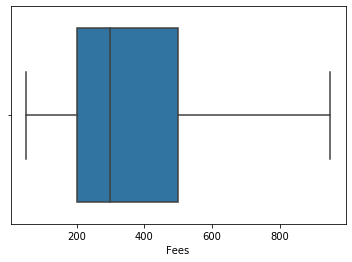

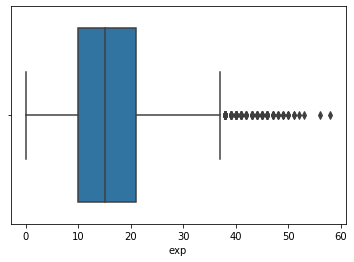

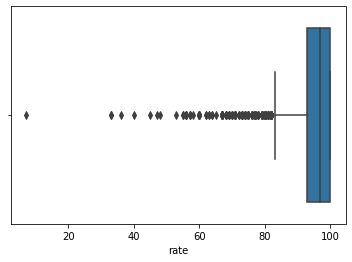

...

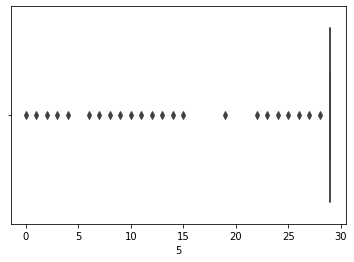

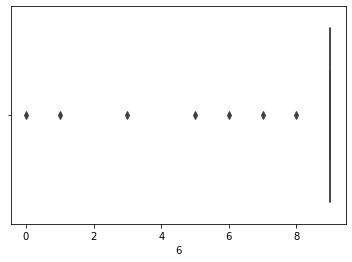

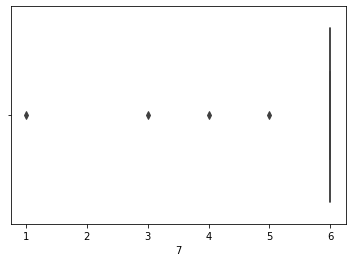

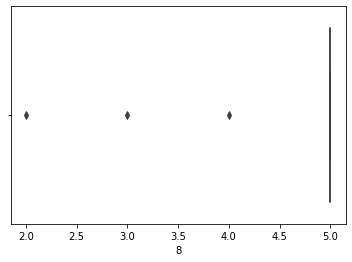

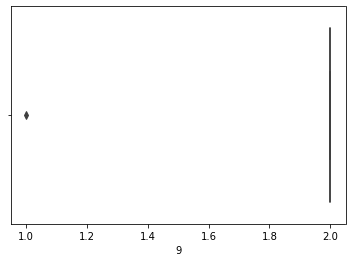

In [174]:
for i in tra.columns:
    sns.boxplot(tra[i])
    plt.show()

In [175]:
from scipy.stats import zscore

In [176]:
z_score=abs(zscore(tra))
print(tra.shape)
dffinal=tra.loc[(z_score<3).all(axis=1)]
print(dffinal.shape)

(2659, 15)
(2413, 15)


In [177]:
dffinal.skew()

Place       0.104184
Profile     0.549534
Fees        0.594337
exp         0.974595
rate       -1.865072
0           0.173042
1          -0.399836
2          -1.987824
3          -5.951734
4         -16.505039
5         -49.122296
6           0.000000
7           0.000000
8           0.000000
9           0.000000
dtype: float64

In [178]:
xn=dffinal.drop(columns=['Fees'])
yn=dffinal['Fees']

In [179]:
for col in xn.columns:
    if xn.skew().loc[col]>0.55:
        xn[col]=np.log1p(xn[col])

In [180]:
xn.skew()

Place       0.104184
Profile     0.549534
exp        -0.700954
rate       -1.865072
0           0.173042
1          -0.399836
2          -1.987824
3          -5.951734
4         -16.505039
5         -49.122296
6           0.000000
7           0.000000
8           0.000000
9           0.000000
dtype: float64

# Now,scaling of data has to be done

In [181]:
from sklearn.preprocessing import StandardScaler

In [182]:
scale=StandardScaler()
xn=scale.fit_transform(xn)


In [183]:
xd=pd.DataFrame(xn)


In [184]:
xd.skew()

0      0.104184
1      0.549534
2     -0.700954
3     -1.865072
4      0.173042
5     -0.399836
6     -1.987824
7     -5.951734
8    -16.505039
9    -49.122296
10     0.000000
11     0.000000
12     0.000000
13     0.000000
dtype: float64

In [185]:
xd.isnull().sum()

0     0
1     0
2     0
3     0
4     0
5     0
6     0
7     0
8     0
9     0
10    0
11    0
12    0
13    0
dtype: int64

In [186]:
yn.isnull().sum()

0

# Splitting the tarin dataset at 20% to select best model

In [187]:
from sklearn.model_selection import train_test_split
xtrain,xtest,ytrain,ytest=train_test_split(xd,yn,test_size=.20,random_state=42)

In [188]:
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import Lasso,Ridge,ElasticNet
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.externals import joblib

In [189]:
def maxr2_score(regr,xd,yn):
    max_r_score=0
    for r_state in range(42,100):
        xtrain,xtest,ytrain,ytest=train_test_split(xd,yn,test_size=.20,random_state=r_state)
        regr.fit(xtrain,ytrain)
        ypred=regr.predict(xtest)
        r2_scr=r2_score(ytest,ypred)
        print('r2 score corresponding to ',r_state,'is',r2_scr)
        if r2_scr>max_r_score:
            max_r_score= r2_scr
            finalrstate=r_state
    print('max r2 score corresponding to',finalrstate,'is',max_r_score)
    return finalrstate

In [190]:
lr = LinearRegression()
svr = SVR()
knr=KNeighborsRegressor()
rfr=RandomForestRegressor()
gbr=GradientBoostingRegressor()
ada=AdaBoostRegressor()
dtr=DecisionTreeRegressor()

parameters={'C': [100, 10, 1.0, 0.1,0.01],'kernel':['linear','poly', 'rbf']}
clf=GridSearchCV(svr,parameters)
clf.fit(xd,yn)
print('best SVR parameters is :',clf.best_params_)
print('\n')
parameters={'n_neighbors':range(1,30)}
clf=GridSearchCV(knr,parameters)
clf.fit(xd,yn)
print('best KNR parameters is :',clf.best_params_)
print('\n')
parameters={'n_estimators':[50,100,150,200,250,300]}
clf=GridSearchCV(rfr,parameters,cv=5)
clf.fit(xd,yn)
print('best RFR parameters is :',clf.best_params_)
print('\n')
parameters={'learning_rate':[0.001,0.01,0.1,1],'n_estimators':[50,100,150,200,250,300]}
clf=GridSearchCV(gbr,parameters,cv=5)
clf.fit(xd,yn)
print('best GBR parameters is :',clf.best_params_)
print('\n')
parameters={'learning_rate':[0.01,0.1,1],'n_estimators':[50,100,150,200,250,300],'base_estimator':[lr,dtr]}
clf=GridSearchCV(ada,parameters,cv=5)
clf.fit(xd,yn)
print('best ADA parameters is :',clf.best_params_)
print('\n')
alphavalue={'alpha':[1,0.1,0.001,0.0001]}
list=[Lasso(),Ridge(),ElasticNet()]
for i in list:
    grid=GridSearchCV(estimator=i,param_grid=alphavalue)
    grid.fit(xd,yn)
    print(grid.best_score_)
    print(grid.best_estimator_.alpha)
    print(grid.best_params_)
    print('\n')

best SVR parameters is : {'C': 10, 'kernel': 'rbf'}


best KNR parameters is : {'n_neighbors': 29}


best RFR parameters is : {'n_estimators': 250}


best GBR parameters is : {'learning_rate': 0.1, 'n_estimators': 200}


best ADA parameters is : {'base_estimator': LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False), 'learning_rate': 0.01, 'n_estimators': 150}


0.0765595399243381
1
{'alpha': 1}


0.0757788439981506
1
{'alpha': 1}


0.07641669306926688
0.1
{'alpha': 0.1}




In [191]:
lr = LinearRegression()
r_state=maxr2_score(lr,xd,yn)
print('\n')
svr = SVR(C=10,kernel='rbf')
r_state=maxr2_score(svr,xd,yn)
print('\n')
knr=KNeighborsRegressor(n_neighbors= 29)
r_state=maxr2_score(knr,xd,yn)
print('\n')
rfr=RandomForestRegressor(n_estimators=250)
r_state=maxr2_score(rfr,xd,yn)
print('\n')
gbr=GradientBoostingRegressor(learning_rate=0.1,n_estimators=200)
r_state=maxr2_score(gbr,xd,yn)
print('\n')
ada=AdaBoostRegressor(learning_rate=0.01,n_estimators=150,base_estimator=lr)
r_state=maxr2_score(ada,xd,yn)
print('\n')
la=Lasso(alpha=1)
r_state=maxr2_score(la,xd,yn)
print('\n')


r2 score corresponding to  42 is 0.06431639456605298
r2 score corresponding to  43 is 0.06868661968025713
r2 score corresponding to  44 is 0.07835947397392784
r2 score corresponding to  45 is 0.06135962716617904
r2 score corresponding to  46 is 0.0747205000730744
r2 score corresponding to  47 is 0.08464038416614983
r2 score corresponding to  48 is 0.08546073572170243
r2 score corresponding to  49 is 0.09426354694603278
r2 score corresponding to  50 is 0.08652738818056827
r2 score corresponding to  51 is 0.062126749211611654
r2 score corresponding to  52 is 0.08126228075798714
r2 score corresponding to  53 is 0.05342435643398902
r2 score corresponding to  54 is 0.06640720353470497
r2 score corresponding to  55 is 0.07305306089959485
r2 score corresponding to  56 is 0.09555395697599556
r2 score corresponding to  57 is 0.03568466260037906
r2 score corresponding to  58 is 0.07277465481106848
r2 score corresponding to  59 is 0.061979571247451015
r2 score corresponding to  60 is 0.0691998669

r2 score corresponding to  81 is 0.11103714494673034
r2 score corresponding to  82 is 0.10032758441476586
r2 score corresponding to  83 is 0.07260876466110366
r2 score corresponding to  84 is 0.12265301539804596
r2 score corresponding to  85 is 0.04141874183456473
r2 score corresponding to  86 is 0.11375989531239017
r2 score corresponding to  87 is 0.11076331476299184
r2 score corresponding to  88 is 0.15024754508104965
r2 score corresponding to  89 is 0.10876563101663461
r2 score corresponding to  90 is 0.08727706511589639
r2 score corresponding to  91 is 0.08053678095672978
r2 score corresponding to  92 is 0.09986190002745288
r2 score corresponding to  93 is 0.15921903451221564
r2 score corresponding to  94 is 0.1299130603281059
r2 score corresponding to  95 is 0.09300700623525049
r2 score corresponding to  96 is 0.08096977913088366
r2 score corresponding to  97 is 0.12537190908667994
r2 score corresponding to  98 is 0.08901592801557823
r2 score corresponding to  99 is 0.123444114759

r2 score corresponding to  59 is 0.06548666491023913
r2 score corresponding to  60 is 0.06809532969911125
r2 score corresponding to  61 is 0.08340177339318944
r2 score corresponding to  62 is 0.10300060966944413
r2 score corresponding to  63 is 0.07689289771578656
r2 score corresponding to  64 is 0.07709789137267642
r2 score corresponding to  65 is 0.09792861967693212
r2 score corresponding to  66 is 0.039581763609274345
r2 score corresponding to  67 is 0.09902421628354119
r2 score corresponding to  68 is 0.08176846590999409
r2 score corresponding to  69 is 0.06968477818249708
r2 score corresponding to  70 is 0.075569295013314
r2 score corresponding to  71 is 0.04387638092648016
r2 score corresponding to  72 is 0.11180455889440832
r2 score corresponding to  73 is 0.07770321476663511
r2 score corresponding to  74 is 0.08667670972629882
r2 score corresponding to  75 is 0.05997180912683975
r2 score corresponding to  76 is 0.05934805890124928
r2 score corresponding to  77 is 0.100448342846

In [192]:
models=[]
models.append(('LinearRegression',lr))
models.append(('SVR',svr))
models.append(('kNeighborsRegressor',knr))
models.append(('RFR',rfr))
models.append(('GBR',gbr))
models.append(('ADAREG',ada))
models.append(('Lasso',la))


In [193]:
from sklearn.model_selection import cross_val_score

In [194]:
Model=[]
score=[]
cvs=[]
for name,model in models:
    print('****,name,****')
    print('\n')
    Model.append(name)
    model.fit(xtrain,ytrain)
    print(model)
    pre=model.predict(xtest)
    print('\n')
    RS=r2_score(ytest,pre)
    print('r2 score',RS)
    score.append(RS*100)
    print('\n')
    sc=cross_val_score(model,xd,yn,cv=5,scoring='r2').mean()
    print('Cross val score',sc)
    cvs.append(sc*100)
    print('\n')
    

****,name,****


LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)


r2 score 0.06431639456605298


Cross val score 0.07577071298252314


****,name,****


SVR(C=10, cache_size=200, coef0=0.0, degree=3, epsilon=0.1, gamma='scale',
    kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False)


r2 score 0.04083650872938527


Cross val score 0.07217988445675079


****,name,****


KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
                    metric_params=None, n_jobs=None, n_neighbors=29, p=2,
                    weights='uniform')


r2 score 0.06001985853450542


Cross val score 0.09037365585530925


****,name,****


RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      

In [195]:
result=pd.DataFrame({'Model':Model,'r2_score': score,'Cross val score': cvs})
result

,Model,r2_score,Cross val score
0,LinearRegression,6.431639,7.577071
1,SVR,4.083651,7.217988
2,kNeighborsRegressor,6.001986,9.037366
3,RFR,7.253366,8.537506
4,GBR,12.922814,15.075793
5,ADAREG,6.610355,7.579061
6,Lasso,6.452264,7.655954


# After having tried all the above models , GBR is working best
Also, random state corresponding to max r2 score in GBR is 48

In [196]:
xtrain,xtest,ytrain,ytest=train_test_split(xd,yn,test_size=.20,random_state=48)
gbr=GradientBoostingRegressor(learning_rate=0.1,n_estimators=200)
gbr.fit(xtrain,ytrain)
ypred=gbr.predict(xtest)

# Final model is as follows

In [197]:
print('RMSE is',np.sqrt(mean_squared_error(ytest,ypred)))
print('r2_score is',r2_score(ytest,ypred))

RMSE is 167.61642994129568
r2_score is 0.22172719111367512


# Getting the test file

In [198]:
tes.head()

,Place,Profile,Fees,exp,rate,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16
2659,228,2,NaN,40,70,52,41,345,186,85,29,9,6,5,2,1,1,1,1,1,1,1
2660,249,1,NaN,16,100,2,216,345,186,85,29,9,6,5,2,1,1,1,1,1,1,1
2661,606,1,NaN,14,90,2,215,345,186,85,29,9,6,5,2,1,1,1,1,1,1,1
2662,148,3,NaN,23,94,52,104,345,186,85,29,9,6,5,2,1,1,1,1,1,1,1
2663,34,1,NaN,9,94,2,228,345,186,85,29,9,6,5,2,1,1,1,1,1,1,1


In [199]:
tes.drop(columns=[10,11,12,13,14,15,16],inplace=True)

In [200]:
tes.drop(columns=['Fees'],inplace=True)

In [201]:
tes.isnull().sum()

Place      0
Profile    0
exp        0
rate       0
0          0
1          0
2          0
3          0
4          0
5          0
6          0
7          0
8          0
9          0
dtype: int64

In [202]:
tes.dtypes

Place      int32
Profile    int32
exp        int32
rate       int32
0          int32
1          int32
2          int32
3          int32
4          int32
5          int32
6          int32
7          int32
8          int32
9          int32
dtype: object

In [203]:
z_score=abs(zscore(tes))
print(tes.shape)
dfnew=tes.loc[(z_score<3).all(axis=1)]
print(dfnew.shape)

(897, 14)
(818, 14)


In [204]:
for col in dfnew.columns:
    if dfnew.skew().loc[col]>0.55:
        dfnew[col]=np.log1p(dfnew[col])

In [205]:
dfnew.skew()

Place       0.162740
Profile     0.472777
exp        -0.155218
rate       -1.682332
0           0.102470
1          -0.352803
2          -1.847343
3          -5.181577
4         -26.526095
5           0.000000
6           0.000000
7           0.000000
8           0.000000
9           0.000000
dtype: float64

In [206]:
dfnew.isnull().sum()

Place      0
Profile    0
exp        0
rate       0
0          0
1          0
2          0
3          0
4          0
5          0
6          0
7          0
8          0
9          0
dtype: int64

In [207]:
scale=StandardScaler()
dfnew=scale.fit_transform(dfnew)


In [208]:
d_final=pd.DataFrame(dfnew)

In [209]:
d_final.isnull().sum()

0     0
1     0
2     0
3     0
4     0
5     0
6     0
7     0
8     0
9     0
10    0
11    0
12    0
13    0
dtype: int64

In [210]:
joblib.dump(gbr,'Model_doctor.obj')

['Model_doctor.obj']

In [211]:
model=joblib.load('Model_doctor.obj')

# Using the test file to make predictions

In [212]:
model.predict(d_final)

array([300.93701617, 349.80073286, 361.63607699, 234.17525138,
       173.5871037 , 242.76552184, 379.0974811 , 404.48444913,
       347.55693632, 318.53440736, 348.27233404, 327.09084714,
       196.19374569, 476.48021896, 475.44927804, 419.14887304,
       396.97461222, 275.3005252 , 311.95972544, 281.57567274,
       386.52958255, 251.57947825, 323.90721807, 415.54224987,
       255.84830512, 539.89318422, 429.94748707, 324.99319637,
       358.74934231, 420.06739213, 375.93901092, 253.11891317,
       355.69739014, 446.25446955, 382.33092591, 388.11419616,
       228.21470251, 440.57397901, 311.29925984, 351.42694547,
       423.17082489, 361.97272633, 258.09416331, 225.53269604,
       247.89255833, 290.77670499, 377.19328945, 292.67833115,
       290.3664522 , 336.90304884, 300.8596544 , 382.69592848,
       252.10475536, 243.78020244, 241.45006568, 327.40670542,
       409.12505115, 407.20812951, 312.54691446, 268.16902188,
       297.70975704, 294.24503742, 343.87137218, 235.69